In [1]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
import regex as re
import random
import plotly.graph_objs as go

from mlxtend.frequent_patterns import apriori
from mlxtend.frequent_patterns import association_rules

from sklearn.preprocessing import OneHotEncoder 
from sklearn.compose import ColumnTransformer 

from sklearn.decomposition import PCA

from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
from sklearn.metrics import silhouette_score




color = sns.color_palette()


%matplotlib inline

**Load** **Data**

In [2]:
aisles=pd.read_csv("aisles.csv")
departments=pd.read_csv("departments.csv")
orders=pd.read_csv("orders.csv")
products=pd.read_csv("products.csv")
prior=pd.read_csv("order_products__prior.csv")


In [4]:
aisles.head()

,aisle_id,aisle
0,1,prepared soups salads
1,2,specialty cheeses
2,3,energy granola bars
3,4,instant foods
4,5,marinades meat preparation


In [5]:
departments.head()


,department_id,department
0,1,frozen
1,2,other
2,3,bakery
3,4,produce
4,5,alcohol


In [6]:
orders.head()

,order_id,user_id,eval_set,order_number,order_dow,order_hour_of_day,days_since_prior_order
0,2539329,1,prior,1,2,8,NaN
1,2398795,1,prior,2,3,7,15.0
2,473747,1,prior,3,3,12,21.0
3,2254736,1,prior,4,4,7,29.0
4,431534,1,prior,5,4,15,28.0


In [7]:
products.head()

,product_id,product_name,aisle_id,department_id
0,1,Chocolate Sandwich Cookies,61,19
1,2,All-Seasons Salt,104,13
2,3,Robust Golden Unsweetened Oolong Tea,94,7
3,4,Smart Ones Classic Favorites Mini Rigatoni Wit...,38,1
4,5,Green Chile Anytime Sauce,5,13


In [8]:
prior.head()


,order_id,product_id,add_to_cart_order,reordered
0,2,33120,1,1
1,2,28985,2,1
2,2,9327,3,0
3,2,45918,4,1
4,2,30035,5,0


**Understanding of data**

**orders (3.4m rows, 206k users):**

order_id: order identifier
user_id: customer identifier
eval_set: which evaluation set this order belongs in (see SET described below)
order_number: the order sequence number for this user (1 = first, n = nth)
order_dow: the day of the week the order was placed on
order_hour_of_day: the hour of the day the order was placed on
days_since_prior: days since the last order, capped at 30 (with NAs for order_number = 1)

**products (50k rows):**

product_id: product identifier
product_name: name of the product
aisle_id: foreign key
department_id: foreign key

**aisles (134 rows):**

aisle_id: aisle identifier
aisle: the name of the aisle

**deptartments (21 rows):**

department_id: department identifier
department: the name of the department

**order_products__SET (30m+ rows):**

order_id: foreign key
product_id: foreign key
add_to_cart_order: order in which each product was added to cart
reordered: 1 if this product has been ordered by this user in the past, 0 otherwise
where SET is one of the four following evaluation sets (eval_set in orders):


***Merge data files to make it into mega table***

In [ ]:
order_prior = pd.merge(prior,orders,on=['order_id','order_id'])
order_prior = order_prior.sort_values(by=['user_id','order_id'])
order_prior.head()

In [4]:
prior_product = pd.merge(prior,products, on = ['product_id','product_id'])
prior_product.head()
order_product = pd.merge(prior_product,orders,on=['order_id','order_id'])
order_product.head()
op_aisles = pd.merge(order_product,aisles,on=['aisle_id','aisle_id'])
op_aisles.head()

,order_id,product_id,add_to_cart_order,reordered,product_name,aisle_id,department_id,user_id,eval_set,order_number,order_dow,order_hour_of_day,days_since_prior_order,aisle
0,2,33120,1,1,Organic Egg Whites,86,16,202279,prior,3,5,9,8.0,eggs
1,26,33120,5,0,Organic Egg Whites,86,16,153404,prior,2,0,16,7.0,eggs
2,120,33120,13,0,Organic Egg Whites,86,16,23750,prior,11,6,8,10.0,eggs
3,327,33120,5,1,Organic Egg Whites,86,16,58707,prior,21,6,9,8.0,eggs
4,390,33120,28,1,Organic Egg Whites,86,16,166654,prior,48,0,12,9.0,eggs


In [11]:
op_aisles[op_aisles['product_name']=='Banana']

,order_id,product_id,add_to_cart_order,reordered,product_name,aisle_id,department_id,user_id,eval_set,order_number,order_dow,order_hour_of_day,days_since_prior_order,aisle
6815207,26,24852,2,1,Banana,24,4,153404,prior,2,0,16,7.0,fresh fruits
6815216,608,24852,4,1,Banana,24,4,91030,prior,11,3,21,12.0,fresh fruits
6815220,771,24852,1,1,Banana,24,4,73968,prior,16,0,17,7.0,fresh fruits
6815227,1097,24852,1,1,Banana,24,4,30502,prior,5,4,0,8.0,fresh fruits
6815234,1193,24852,2,1,Banana,24,4,113928,prior,12,4,21,9.0,fresh fruits
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9620223,3420971,24852,6,1,Banana,24,4,105897,prior,5,3,14,1.0,fresh fruits
9620226,3421027,24852,3,1,Banana,24,4,51127,prior,64,2,20,2.0,fresh fruits
9620229,3421038,24852,2,0,Banana,24,4,93286,prior,8,6,9,15.0,fresh fruits
9620231,3421078,24852,2,1,Banana,24,4,70170,prior,10,5,11,7.0,fresh fruits


**DATA CLEANING**

In [12]:
# SHAPE OF MEGA TABLE
op_aisles.shape

(32434489, 14)

In [13]:
# percentage of null columns
def table(name):
   sum=name.isnull().sum()
   row_co=name.count()
   return sum/row_co*100

table(op_aisles)

order_id                  0.000000
product_id                0.000000
add_to_cart_order         0.000000
reordered                 0.000000
product_name              0.000000
aisle_id                  0.000000
department_id             0.000000
user_id                   0.000000
eval_set                  0.000000
order_number              0.000000
order_dow                 0.000000
order_hour_of_day         0.000000
days_since_prior_order    6.845563
aisle                     0.000000
dtype: float64

since there are only 7 % of missing values in days_since_prior_order. I believe a good method would be removing all the rows with null values rather than muting with mean or mode. 

In [5]:
# droping all the rows that have null values
combined_table= op_aisles.dropna(how='any',axis=0) 
combined_table.isnull().sum()

order_id                  0
product_id                0
add_to_cart_order         0
reordered                 0
product_name              0
aisle_id                  0
department_id             0
user_id                   0
eval_set                  0
order_number              0
order_dow                 0
order_hour_of_day         0
days_since_prior_order    0
aisle                     0
dtype: int64

In [15]:
# data types of all columns
combined_table.dtypes

order_id                    int64
product_id                  int64
add_to_cart_order           int64
reordered                   int64
product_name               object
aisle_id                    int64
department_id               int64
user_id                     int64
eval_set                   object
order_number                int64
order_dow                   int64
order_hour_of_day           int64
days_since_prior_order    float64
aisle                      object
dtype: object

**EXPLORING DATA**





*   Unique items list
*   No.of asiles
*   Top 10 Most purchased products
*   At what time most orders are coming






In [15]:
# no.of unique items
len(set(combined_table['product_name']))

49646

In [16]:
# No.of aisle
len(set(combined_table['aisle']))

134

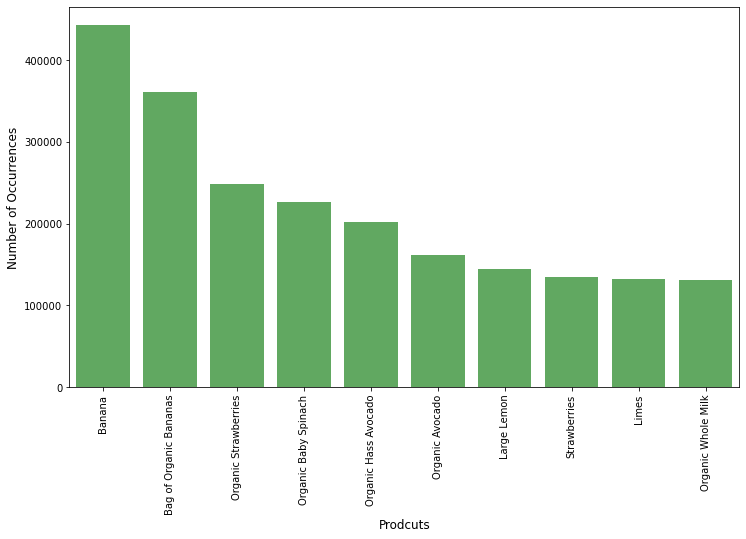

In [17]:
# top 10 most purchased products
top10=combined_table.groupby(['product_name'])['product_name'].count().nlargest(10)
plt.figure(figsize=(12,7))
sns.barplot(x=top10.index, y=top10.values, alpha=0.8, color=color[2])
plt.ylabel('Number of Occurrences', fontsize=12)
plt.xlabel('Prodcuts', fontsize=12)
plt.xticks(rotation='vertical')
plt.show()


Out of 10 products 7 of them are organic products. We can say people prefer to purchase organic products more than regular products.

Lets check which organic products are most purchased

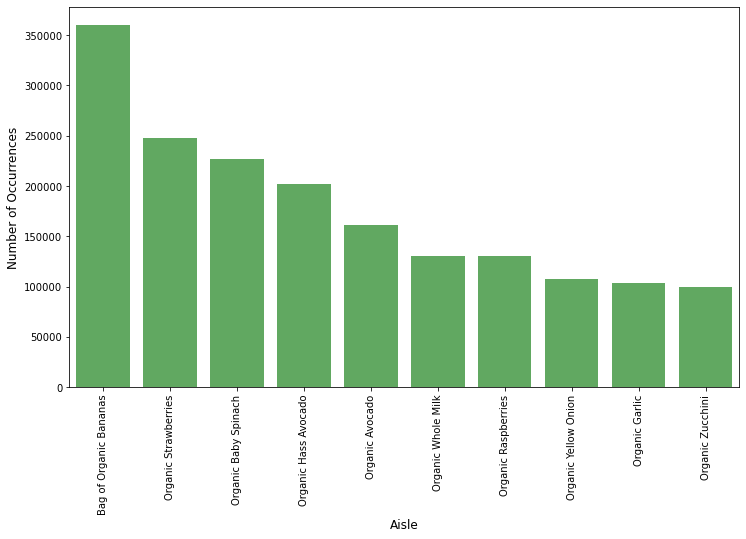

In [18]:
# top 10 organic
top10_organic=combined_table[combined_table['product_name'].str.contains("Organic")].groupby(['product_name'])['product_name'].count().nlargest(10)
plt.figure(figsize=(12,7))
sns.barplot(x=top10_organic.index, y=top10_organic.values, alpha=0.8, color=color[2])
plt.ylabel('Number of Occurrences', fontsize=12)
plt.xlabel('Aisle', fontsize=12)
plt.xticks(rotation='vertical')
plt.show()

Most of the organic products purchased above belong to fruits and vegetables category. Lets check from which aisle most organic products are purchased

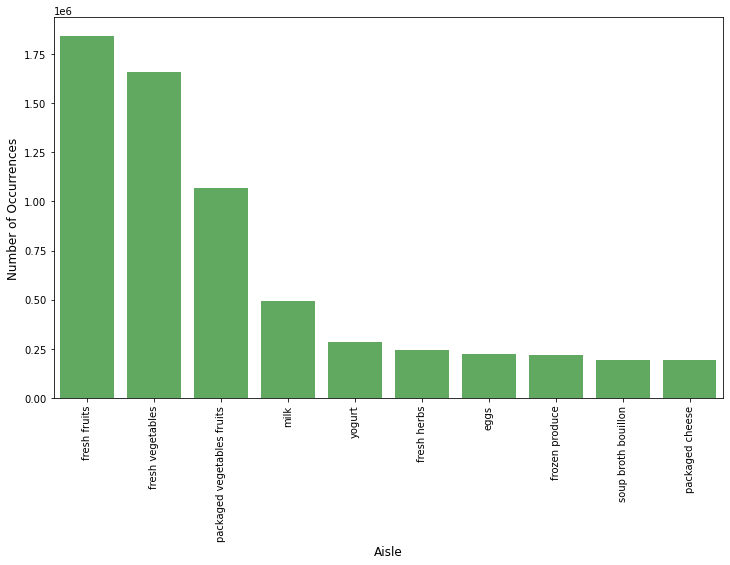

In [19]:
#top10 aisle
top10_aisle=combined_table[combined_table['product_name'].str.contains("Organic")].groupby('aisle')['aisle'].count().nlargest(10)
plt.figure(figsize=(12,7))
sns.barplot(x=top10_aisle.index, y=top10_aisle.values, alpha=0.8, color=color[2])
plt.ylabel('Number of Occurrences', fontsize=12)
plt.xlabel('Aisle', fontsize=12)
plt.xticks(rotation='vertical')
plt.show()


* At what time of the day most products were orderd 

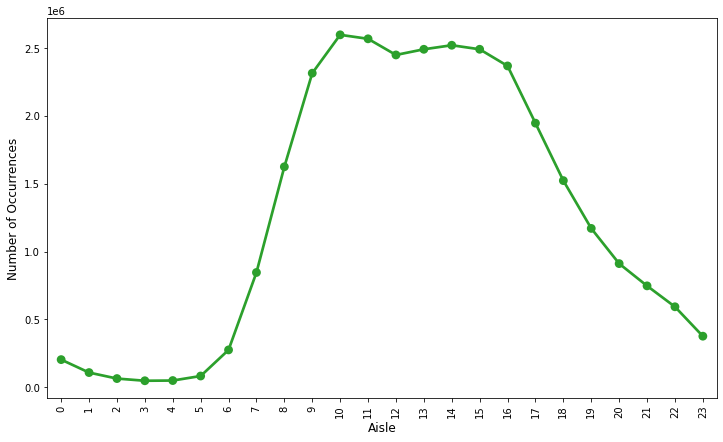

In [20]:
# order hour
order_hour=combined_table.groupby(['order_hour_of_day'])['order_hour_of_day'].count()
plt.figure(figsize=(12,7))
sns.pointplot(x=order_hour.index, y=order_hour.values, alpha=0.8, color=color[2])
plt.ylabel('Number of Occurrences', fontsize=12)
plt.xlabel('Aisle', fontsize=12)
plt.xticks(rotation='vertical')
plt.show()

We Can see most products are ordered at between 9 Am and 4 Pm.

In [21]:
# most reorderd product
combined_table[['product_name','reordered']].groupby(['product_name'])['product_name'].count().nlargest(10)

product_name
Banana                    443031
Bag of Organic Bananas    360292
Organic Strawberries      248219
Organic Baby Spinach      226973
Organic Hass Avocado      202478
Organic Avocado           161628
Large Lemon               144297
Strawberries              134291
Limes                     132029
Organic Whole Milk        130682
Name: product_name, dtype: int64

Based on above result we can say most reordered products are proportionate to most purchased products

***Association Rules Mining*** 

*Association rule mining is a procedure which aims to observe frequently occurring patterns, correlations, or associations from datasets*

Data preprocessing for assosiation rule mining

*   one hot encoding product name




There are almost 50000 unique product list. Creating 50000 cloumns with one hot endoing is computationaly heavy. Best possible way to solve this is taking limited no.of products.

In [7]:
# dictonary of products
# item_id= top 20 highest purchased product id
# items= product_id that range from 24852-32000
item_id=[13176,21137,21903,47209,47626,16797,22935,45007,39275,49683,5876,8277,40706,4920,30391,45066,42265,49235,19057,44632,37646,21616,17794]  
items = [*range(2600,32000)]
lis=items+item_id


In [8]:
sample=combined_table[combined_table['product_id'].isin(lis)]

In [18]:
sample

,order_id,product_id,add_to_cart_order,reordered,product_name,aisle_id,department_id,user_id,eval_set,order_number,order_dow,order_hour_of_day,days_since_prior_order,aisle
22,2082,11520,3,0,Large Alfresco Eggs,86,16,108338,prior,3,3,13,10.0,eggs
27,2846,30233,11,1,Organic Large Brown Grade AA Cage Free Eggs,86,16,168005,prior,31,4,15,15.0,eggs
39,4254,30233,3,1,Organic Large Brown Grade AA Cage Free Eggs,86,16,129196,prior,14,1,10,6.0,eggs
61,7835,18465,16,1,Organic Grade A Free Range Large Brown Eggs,86,16,97593,prior,15,4,20,7.0,eggs
75,10264,18465,14,1,Organic Grade A Free Range Large Brown Eggs,86,16,127673,prior,11,6,8,7.0,eggs
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32434484,3243156,20731,1,0,Straight Sherry,134,5,166400,prior,3,1,13,12.0,specialty wines champagnes
32434485,860862,30582,1,0,Natural Champagne,134,5,104017,prior,13,5,14,18.0,specialty wines champagnes
32434486,1333472,27906,1,0,Imperial Champagne,134,5,62079,prior,10,3,10,10.0,specialty wines champagnes
32434487,2122701,26086,1,1,La Grand Dame Brut Champagne,134,5,77799,prior,2,3,14,3.0,specialty wines champagnes


In [9]:
random=sample.iloc[:1000000,:]

In [74]:
basket=random.groupby(['order_id', 'product_id'])['add_to_cart_order'].sum().unstack().reset_index().fillna(0).set_index('order_id')

In [75]:
basket

product_id,2780,2846,2904,3019,3068,3188,3237,3243,3266,3281,...,31248,31262,31274,31553,31562,31821,31950,31985,45007,49683
order_id,,,,,,,,,,,,,,,,,,,,,
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
22,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
25,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
27,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
31,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3421030,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,28.0,0.0
3421036,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3421055,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [76]:
def encode_units(x):
    if x <= 0:
        return 0
    if x >= 1:
        return 1

basket_sets = basket.applymap(encode_units)


In [77]:
basket_sets

product_id,2780,2846,2904,3019,3068,3188,3237,3243,3266,3281,...,31248,31262,31274,31553,31562,31821,31950,31985,45007,49683
order_id,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
22,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
25,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
27,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
31,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3421030,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
3421036,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3421055,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [78]:
# model
freq_items= apriori(basket_sets,min_support=0.01,use_colnames=True)

freq_items

,support,itemsets
0,0.011055,(3952)
1,0.037455,(4605)
2,0.021788,(5782)
3,0.012469,(8193)
4,0.022188,(8424)
5,0.041762,(8518)
6,0.023834,(9839)
7,0.016642,(10246)
8,0.033377,(10749)
9,0.073882,(11520)


In [81]:
rules=association_rules(freq_items,metric="lift",min_threshold=2)


In [82]:
rules.head()

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(17794),(4605),0.130212,0.037455,0.010691,0.082106,2.192152,0.005814,1.048646
1,(4605),(17794),0.037455,0.130212,0.010691,0.285444,2.192152,0.005814,1.217243
2,(24964),(22935),0.076411,0.071228,0.017812,0.233102,3.272642,0.012369,1.211077
3,(22935),(24964),0.071228,0.076411,0.017812,0.250067,3.272642,0.012369,1.231562
4,(45007),(22935),0.068135,0.071228,0.010043,0.147391,2.069297,0.005189,1.089330


In [90]:
dic=['17794','4605','24964','22935','45007']
products[products['product_id'].isin(dic)]

,product_id,product_name,aisle_id,department_id
4604,4605,Yellow Onions,83,4
17793,17794,Carrots,83,4
22934,22935,Organic Yellow Onion,83,4
24963,24964,Organic Garlic,83,4
45006,45007,Organic Zucchini,83,4


Clustering with PCA

In [10]:

id_name=random.groupby(['user_id', 'product_name'])['add_to_cart_order'].sum().unstack().reset_index().fillna(0).set_index('user_id')

In [169]:
id_name

product_name,100% Baby Kale,100% Egg Whites,100% Liquid Egg Whites,100% Natural Broccoli Sprouts With Long Lasting Antioxidant Activity,All Natural 100% Egg Whites,All Whites 100% Egg Whites,Anise Fennel,Arugula,Asparagus Spears,Asparagus Tips,...,White Turnip,White Whole Mushrooms,Whole Baby Bella Mushrooms,Yellow Grape Tomatoes,Yellow Onions,Yellow Potato,Yellow Squash,Yellow Sweet Corn,Yellow Tomato,Yukon Gold Potatoes 5lb Bag
user_id,,,,,,,,,,,,,,,,,,,,,
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
206204,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
206206,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
206207,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Our data is in scale of 0 and 1. So there is no more aadditional scaling required for performing PCA

In [12]:
# 90% variance 
from sklearn.decomposition import PCA
pca = PCA(n_components=0.95)
pca_samples = pca.fit_transform(id_name)

Text(0, 0.5, 'Variance %')

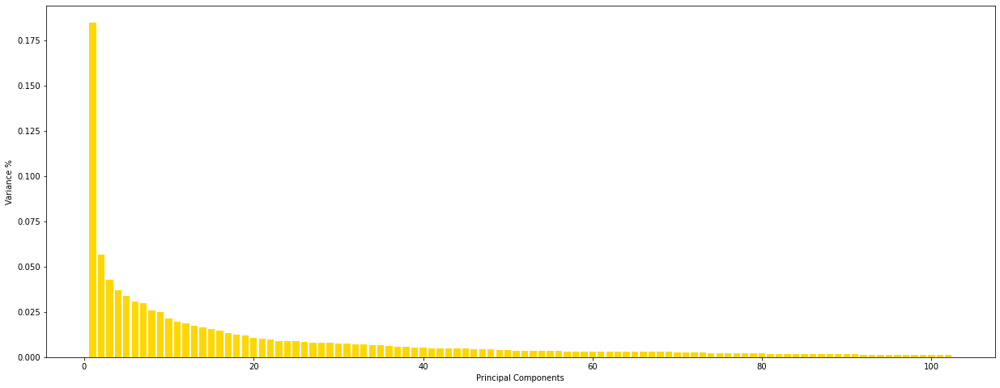

In [13]:
PC = range(1, pca.n_components_+1)
fig = plt.figure(figsize=(21,8))
plt.bar(PC, pca.explained_variance_ratio_, color='gold')
plt.xlabel('Principal Components')
plt.ylabel('Variance %')


Our first componenet contains 17% variance

In [173]:
# checking no.of componenets defiene 95% variance
pc = pd.DataFrame(pca_samples)
pc.head()

,0,1,2,3,4,5,6,7,8,9,...,63,64,65,66,67,68,69,70,71,72
0,-11.278178,-0.085609,-0.188899,0.109796,-1.838010,0.246253,-2.890197,2.380911,-0.413030,-1.042968,...,-0.303779,-0.124232,0.420205,0.220474,-0.108815,0.187989,0.431774,0.129507,-0.157808,0.418593
1,-12.603502,-0.130201,0.710127,0.446259,-1.466307,0.934099,-1.379098,-1.329699,0.411028,0.323775,...,-1.521271,0.152305,0.757698,1.635630,-0.692354,-2.488558,0.028498,-0.164355,0.019434,-0.041981
2,-11.034387,0.032001,1.839741,0.430160,-0.886156,-1.903410,-2.871882,-1.897192,2.409407,2.420941,...,-0.018310,-0.149670,0.042103,-0.108029,-0.262775,0.020447,0.103465,-0.092527,-0.235127,-0.093654
3,-12.041049,-0.025083,1.571838,0.498689,-3.949993,-3.304431,5.732869,0.696357,-0.409336,0.815941,...,-0.063382,-0.069801,0.084662,-0.104892,-0.207297,0.092478,-0.008163,-0.068372,-0.221736,-0.033852
4,0.975195,-3.415934,-15.763132,1.553889,-1.320786,1.067257,0.499429,-3.722255,0.506068,0.976758,...,-0.968330,0.449831,0.327910,-1.255940,-1.226290,-0.535688,-0.124990,0.815789,-1.216229,0.213423


    As we can above 90% variance is explained by 73 componenets. We will use these componenets to perform visualization and clustering

Text(0, 0.5, 'PC2')

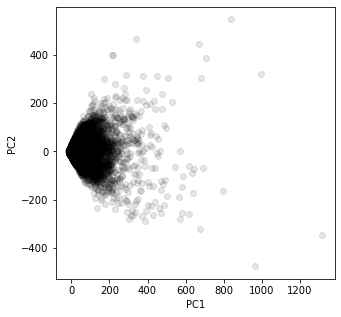

In [174]:
#lets plot first 2 componenets to check if there is any clusters

plt.figure(figsize=(5,5))
plt.scatter(pc[0],pc[1],alpha=.1, color='black')
plt.xlabel('PC1')
plt.ylabel('PC2')

Except for one dense area we can't sense any clusters as of now. Lets implement PCA upon k-means clustering

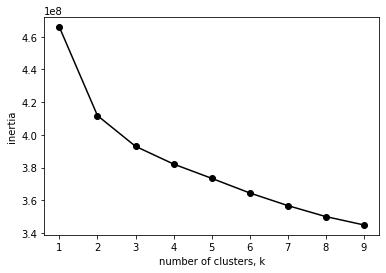

In [175]:
# no.of clusters
ks = range(1, 10)
inertias = []
for k in ks:
    # Create a KMeans instance with k clusters: model
    model = KMeans(n_clusters=k)
    
    # Fit model to samples
    model.fit(pc)
    
    # Append the inertia to the list of inertias
    inertias.append(model.inertia_)
    
plt.plot(ks, inertias, '-o', color='black')
plt.xlabel('number of clusters, k')
plt.ylabel('inertia')
plt.xticks(ks)
plt.show()

In [198]:
kmeans_pca=KMeans(n_clusters=4,init='k-means++',random_state=42).fit(pc)

In [199]:
centers = kmeans_pca.cluster_centers_
c_preds = kmeans_pca.predict(pc)
print (c_preds[0:100])

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 3 0 1 0 0 0]


Text(0.5, 1.0, 'KMeans Clusters  Derived from Original Dataset')

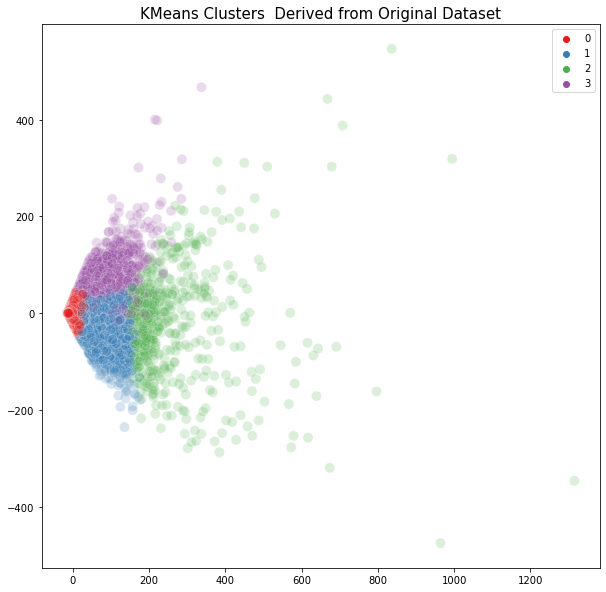

In [200]:
labels_scale = kmeans_pca.labels_
plt.figure(figsize = (10,10))
sns.scatterplot(pca_samples[:,0], pca_samples[:,1], 
                hue=labels_scale, 
                palette='Set1',
                s=100, alpha=0.2).set_title('KMeans Clusters  Derived from Original Dataset', fontsize=15)

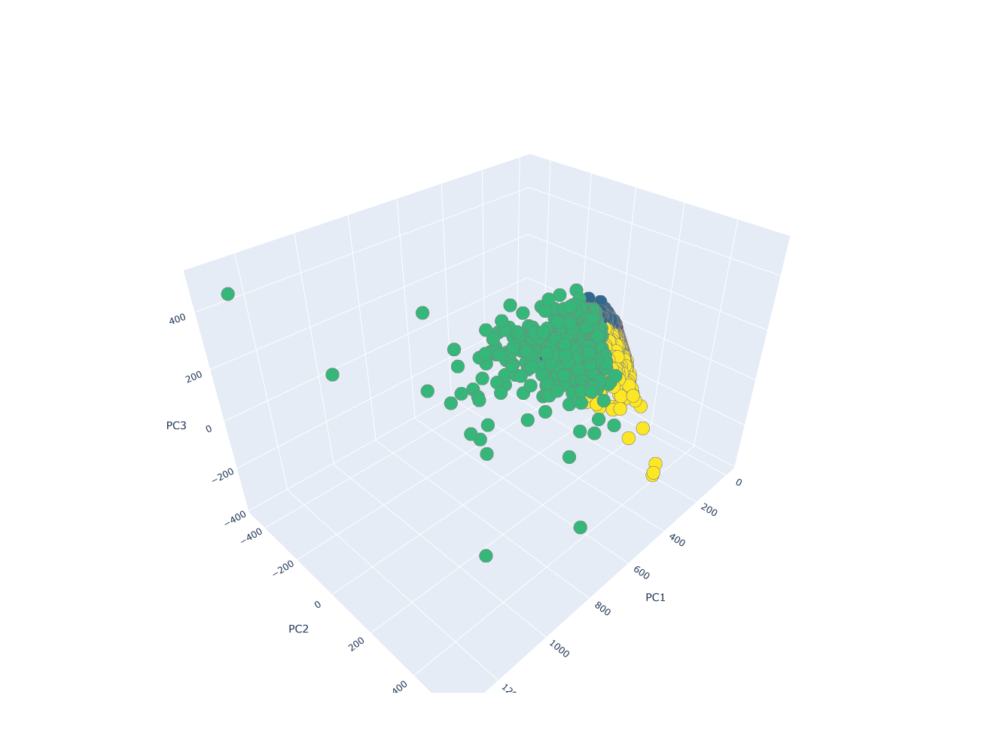

In [201]:
Scene = dict(xaxis = dict(title  = 'PC1'),yaxis = dict(title  = 'PC2'),zaxis = dict(title  = 'PC3'))
labels = labels_scale
trace = go.Scatter3d(x=pca_samples[:,0], y=pca_samples[:,1], z=pca_samples[:,2], mode='markers',marker=dict(color = labels, colorscale='Viridis', size = 10, line = dict(color = 'gray',width = 5)))
layout = go.Layout(margin=dict(l=0,r=0),scene = Scene, height = 1000,width = 1000)
data = [trace]
fig = go.Figure(data = data, layout = layout)
fig.show()

In [202]:
data_cluster=pd.concat((id_name.reset_index(drop=True),pc),axis=1)
data_cluster['cluster_segement']=kmeans_pca.labels_

In [203]:
data_cluster.head()

,100% Baby Kale,100% Egg Whites,100% Liquid Egg Whites,100% Natural Broccoli Sprouts With Long Lasting Antioxidant Activity,All Natural 100% Egg Whites,All Whites 100% Egg Whites,Anise Fennel,Arugula,Asparagus Spears,Asparagus Tips,...,64,65,66,67,68,69,70,71,72,cluster_segement
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-0.124232,0.420205,0.220474,-0.108815,0.187989,0.431774,0.129507,-0.157808,0.418593,0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.152305,0.757698,1.635630,-0.692354,-2.488558,0.028498,-0.164355,0.019434,-0.041981,0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-0.149670,0.042103,-0.108029,-0.262775,0.020447,0.103465,-0.092527,-0.235127,-0.093654,0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-0.069801,0.084662,-0.104892,-0.207297,0.092478,-0.008163,-0.068372,-0.221736,-0.033852,0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.449831,0.327910,-1.255940,-1.226290,-0.535688,-0.124990,0.815789,-1.216229,0.213423,0


Lets apply tSNE with K-means
-> Perform t-sne on pca componenets
-> apply k-means on t-sne
-> intrepret the results

[t-SNE] Computing 241 nearest neighbors...
[t-SNE] Indexed 101775 samples in 1.103s...
[t-SNE] Computed neighbors for 101775 samples in 890.099s...
[t-SNE] Computed conditional probabilities for sample 1000 / 101775
[t-SNE] Computed conditional probabilities for sample 2000 / 101775
[t-SNE] Computed conditional probabilities for sample 3000 / 101775
[t-SNE] Computed conditional probabilities for sample 4000 / 101775
[t-SNE] Computed conditional probabilities for sample 5000 / 101775
[t-SNE] Computed conditional probabilities for sample 6000 / 101775
[t-SNE] Computed conditional probabilities for sample 7000 / 101775
[t-SNE] Computed conditional probabilities for sample 8000 / 101775
[t-SNE] Computed conditional probabilities for sample 9000 / 101775
[t-SNE] Computed conditional probabilities for sample 10000 / 101775
[t-SNE] Computed conditional probabilities for sample 11000 / 101775
[t-SNE] Computed conditional probabilities for sample 12000 / 101775
[t-SNE] Computed conditional prob

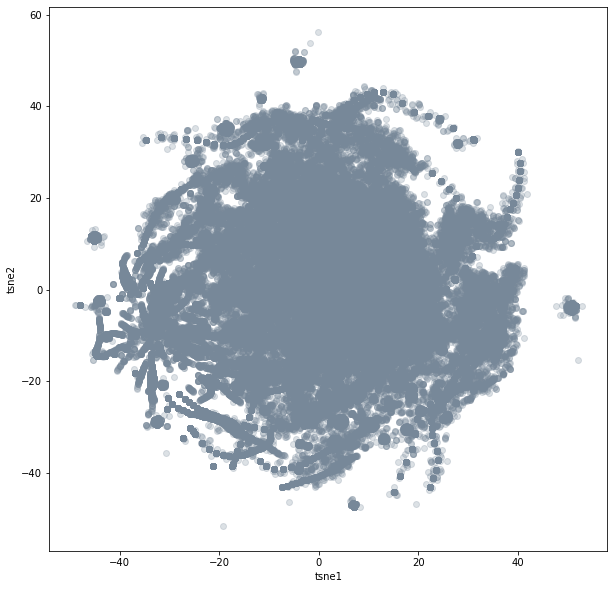

In [185]:
# tsne on pca componenets
tsne = TSNE(n_components=3, verbose=1, perplexity=80, n_iter=5000, learning_rate=200)
tsne_scale_results = tsne.fit_transform(pc)
tsne_df_scale = pd.DataFrame(tsne_scale_results, columns=['tsne1', 'tsne2', 'tsne3'])
plt.figure(figsize = (10,10))
plt.scatter(tsne_df_scale.iloc[:,0],tsne_df_scale.iloc[:,1],alpha=0.25, facecolor='lightslategray')
plt.xlabel('tsne1')
plt.ylabel('tsne2')
plt.show()

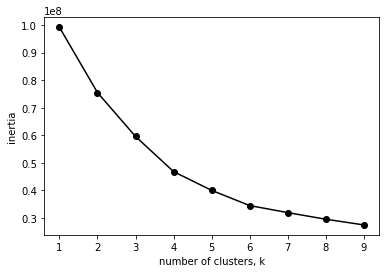

In [189]:
# find optimal number of clusters for k-means with tsne
ks = range(1, 10)
inertias = []
for k in ks:
    # Create a KMeans instance with k clusters: model
    model = KMeans(n_clusters=k)
    
    # Fit model to samples
    model.fit(tsne_df_scale)
    
    # Append the inertia to the list of inertias
    inertias.append(model.inertia_)
    
plt.plot(ks, inertias, '-o', color='black')
plt.xlabel('number of clusters, k')
plt.ylabel('inertia')
plt.xticks(ks)
plt.show()

In [ ]:
kmeans_tsne=KMeans(n_clusters=3,init='k-means++',random_state=42).fit(tsne_df_scale)

In [192]:
centers = kmeans_tsne.cluster_centers_
c_preds = kmeans_tsne.predict(tsne_df_scale)
print (c_preds[0:100])

[0 2 0 2 1 0 1 1 0 1 0 0 2 0 1 2 1 1 0 1 2 0 1 1 0 0 1 0 2 1 1 2 2 2 0 2 1
 2 1 1 1 2 0 2 1 0 2 2 2 1 1 2 1 1 0 2 0 1 1 2 0 1 2 0 2 2 2 1 1 1 1 2 0 1
 0 0 2 2 0 2 1 0 2 1 1 1 1 2 2 2 2 2 1 0 2 1 1 0 0 2]


Text(0.5, 1.0, 'KMeans Clusters  Derived from Original Dataset')

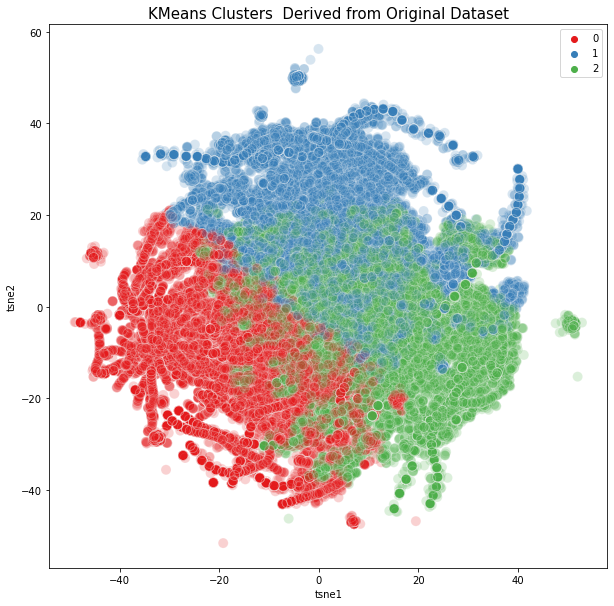

In [197]:
labels_scale = kmeans_tsne.labels_
plt.figure(figsize = (10,10))
sns.scatterplot(tsne_df_scale.iloc[:,0], tsne_df_scale.iloc[:,1], 
                hue=labels_scale, 
                palette='Set1',
                s=100, alpha=0.2).set_title('KMeans Clusters  Derived from Original Dataset', fontsize=15)

In [196]:
tsne_df_scale.head()

,tsne1,tsne2,tsne3
0,-2.264778,-16.109980,15.726626
1,23.886757,-37.178291,-5.067154
2,-12.760964,-5.766865,-12.381774
3,-12.971593,6.998128,-37.498692
4,-1.993513,14.142363,12.340988
